In [1]:
# --- Importing useful libraries ---
import numpy as np
from scipy import stats, special
import pandas as pd
import math as math

# --- Pretty plots ---
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.colors import ListedColormap

rc('axes', axisbelow = True)
rc('font', **{'family': 'serif', 'serif': ["Palatino"]})
plt.rcParams['mathtext.fontset'] = 'custom'
plt.rcParams['mathtext.rm'] = 'Palatino'
plt.rcParams['mathtext.it'] = 'Palatino:italic'
plt.rcParams['mathtext.bf'] = 'Palatino:bold'
rc('text', usetex=True)

import seaborn as sns

cmap = ListedColormap(sns.color_palette("rocket", 256))

sns.set_palette("mako")
# --- Random seed ---
np.random.seed(314159)

In [2]:
filename = 'galdata.csv'
df = pd.read_csv(filename)
df

,Unnamed: 0,RA,Dec,redshift,d_comoving
0,0,195.071285,-0.590771,0.465648,1840.028878
1,1,195.022992,-0.610999,0.565802,2175.683002
2,2,195.079741,0.348981,0.612211,2324.468084
3,3,195.170574,0.359864,0.502060,1964.423026
4,4,195.204289,0.347267,0.559173,2154.085038
...,...,...,...,...,...
850359,850359,221.591765,63.863893,0.199543,846.005115
850360,850360,221.554537,63.825759,0.201655,854.490480
850361,850361,223.989695,63.093170,0.267434,1114.143578
850362,850362,224.145463,62.983435,0.153101,656.784571


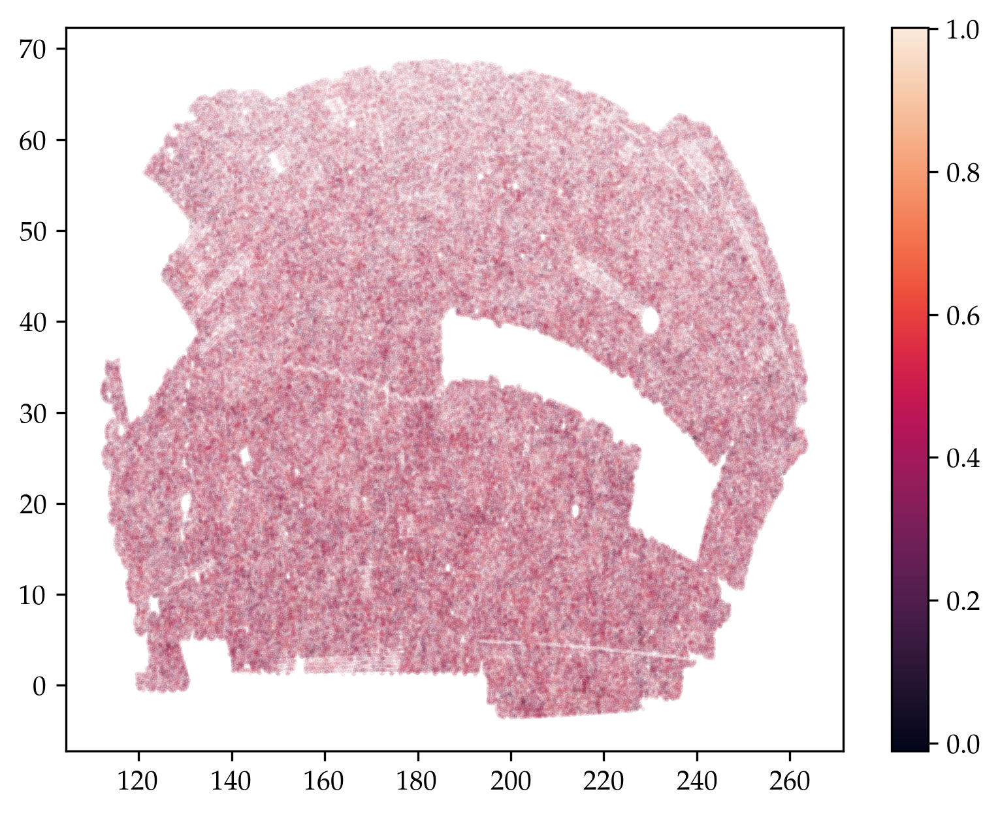

In [4]:
plt.figure(dpi = 300)
scatter=plt.scatter(df['RA'], df['Dec'], s = 0.0001, c = df['redshift'], cmap = cmap )
plt.colorbar(scatter, orientation='vertical', pad=0.05)
#cbar.set_label('Redshift')
plt.show()

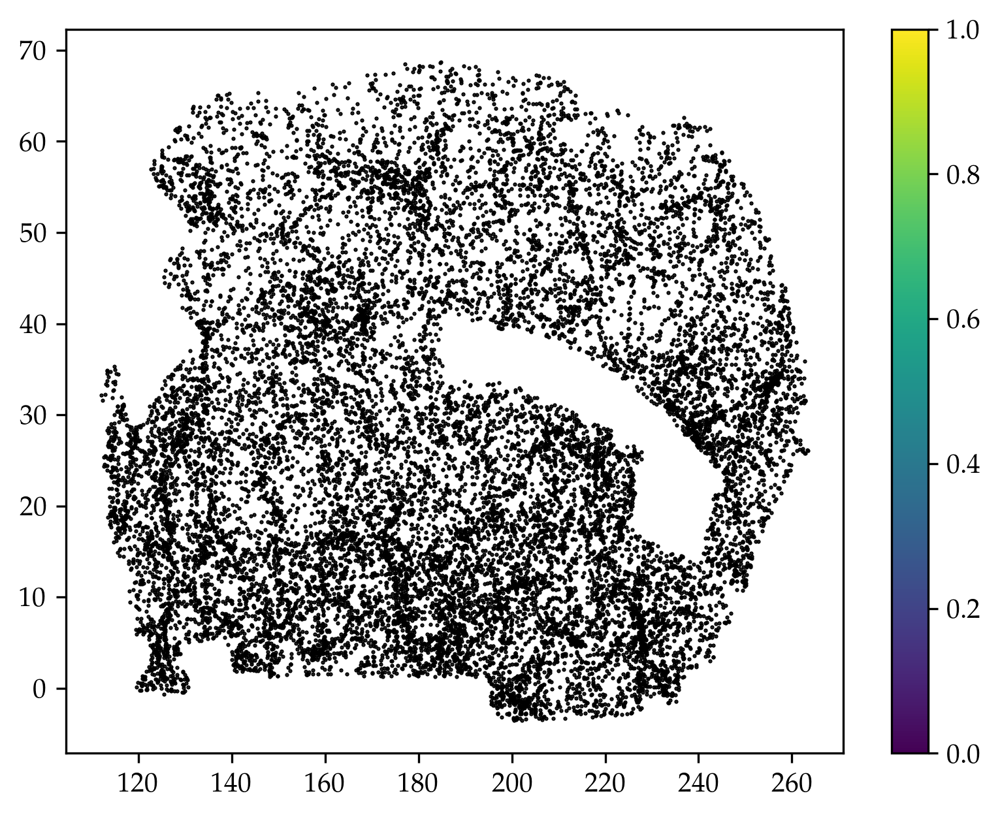

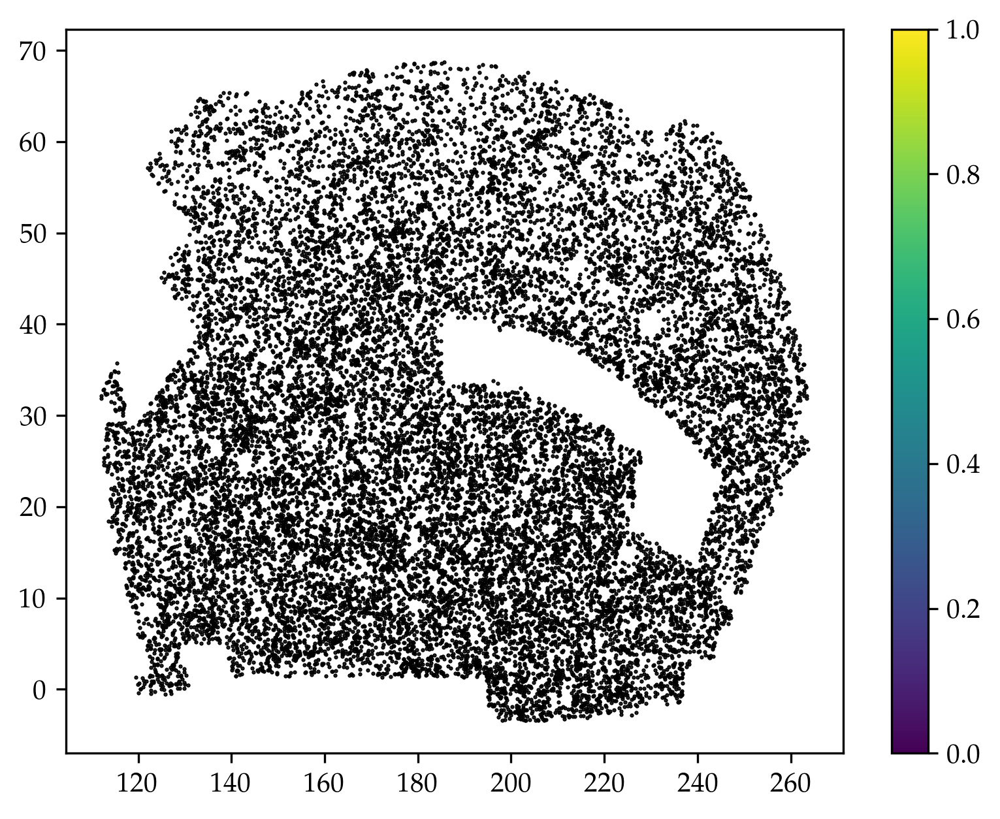

In [5]:
# Define the Declination range (in degrees)
dec_min = 9  # Minimum Declination
dec_max = 12   # Maximum Declination

lowz_min = 0.04
lowz_max = 0.1

hiz_min = 0.7
hiz_max = 1.0
# Create a mask for galaxies within the specified Dec range
#dec_mask = (df['Dec'] >= dec_min) & (df['Dec'] <= dec_max)
lowz_mask = (df['redshift'] >= lowz_min) & (df['redshift'] <= lowz_max)
hiz_mask = (df['redshift'] >= hiz_min) & (df['redshift'] <= hiz_max)
# Apply the mask to filter the data
lowz_df = df[lowz_mask]
hiz_df = df[hiz_mask]

plt.figure(dpi = 300)
#plt.scatter(lowz_df['RA'], lowz_df['Dec'], marker='.' ,s = 1, c = lowz_df['redshift'], cmap = cmap )
scatter=plt.scatter(lowz_df['RA'], lowz_df['Dec'], marker='.', s = 1, color = 'black')
plt.colorbar(scatter, orientation='vertical', pad=0.05)
plt.show()

plt.figure(dpi = 300)
#plt.scatter(hiz_df['RA'], hiz_df['Dec'], marker='.' ,s = 1, c = hiz_df['redshift'], cmap = cmap )
scatter=plt.scatter(hiz_df['RA'], hiz_df['Dec'], marker='.' ,s = 1, color = 'black' )
plt.colorbar(scatter, orientation='vertical', pad=0.05)
plt.show()



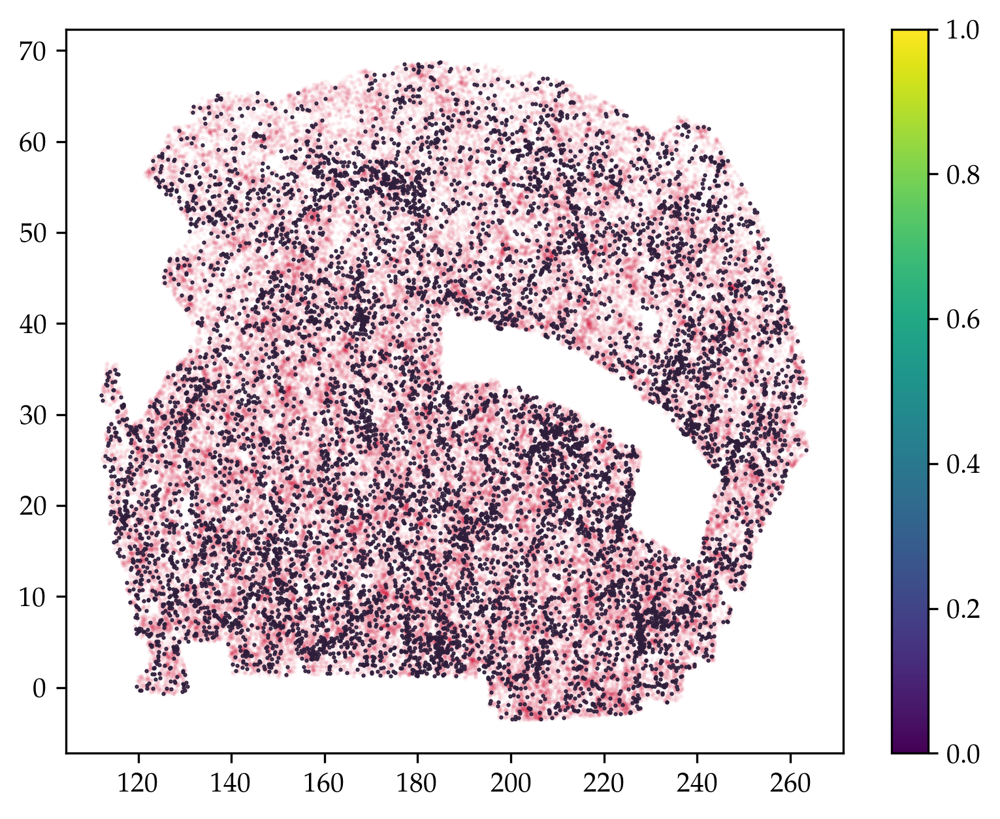

In [6]:
lowz_min = 0.02
lowz_max = 0.08

hiz_min = 0.5
hiz_max = 0.54
# Create a mask for galaxies within the specified Dec range
#dec_mask = (df['Dec'] >= dec_min) & (df['Dec'] <= dec_max)
lowz_mask = (df['redshift'] >= lowz_min) & (df['redshift'] <= lowz_max)
hiz_mask = (df['redshift'] >= hiz_min) & (df['redshift'] <= hiz_max)
# Apply the mask to filter the data
lowz_df = df[lowz_mask]
hiz_df = df[hiz_mask]

plt.figure(dpi = 300)
#plt.scatter(lowz_df['RA'], lowz_df['Dec'], marker='.' ,s = 1, c = lowz_df['redshift'], cmap = cmap )
plt.scatter(hiz_df['RA'], hiz_df['Dec'], marker='.' ,s = 1, color = 'crimson', alpha = 0.05)
plt.scatter(lowz_df['RA'], lowz_df['Dec'], marker='.', s = 1)
plt.colorbar(orientation='vertical', pad=0.05)
plt.show()


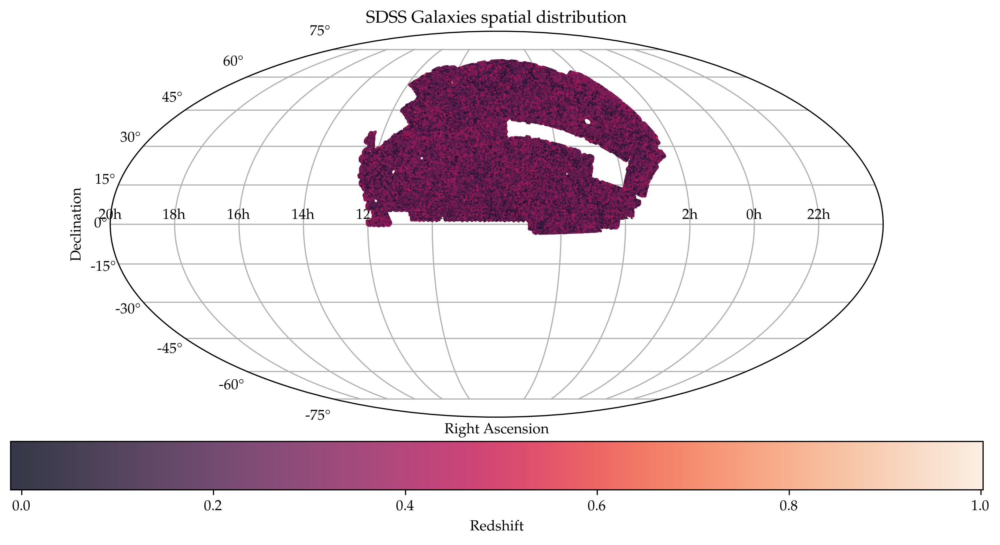

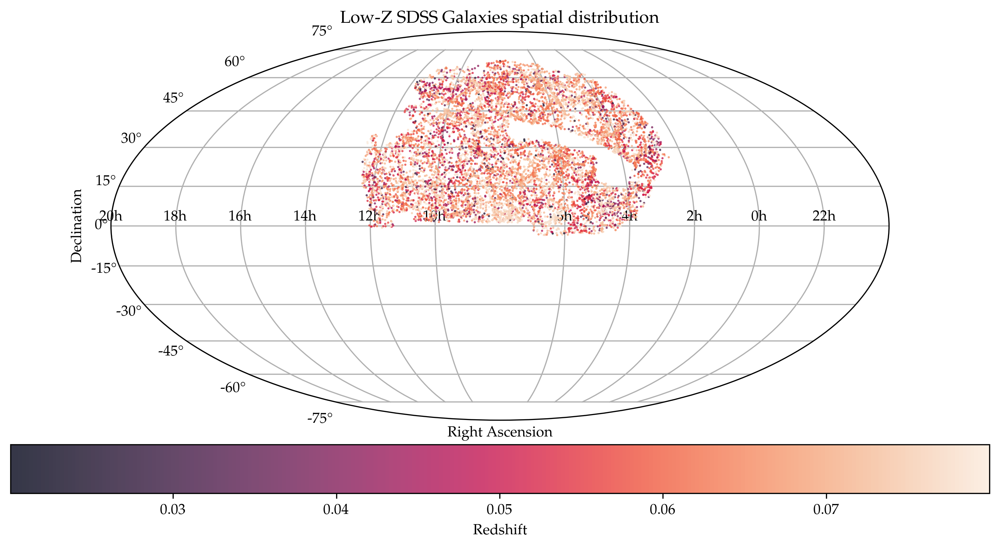

In [7]:
ra_rad = np.deg2rad(df['RA'])
dec_rad = np.deg2rad(df['Dec'])
redshift = df['redshift'].values

# Shift RA values for the Mollweide projection
ra_rad_shifted = ra_rad - np.pi  # Shift RA by 180 degrees

plt.figure(figsize=(12, 6), dpi = 300)
ax = plt.subplot(111, projection='mollweide')

scatter = ax.scatter(ra_rad_shifted, dec_rad, c=redshift, cmap=cmap,  marker='.', s=1, alpha=0.8)

# Add a color bar
cbar = plt.colorbar(scatter, orientation='horizontal', pad=0.05)
cbar.set_label('Redshift')

# Set grid and labels
ax.grid(True)
ax.set_xlabel('Right Ascension')
ax.set_ylabel('Declination')
ax.set_title('SDSS Galaxies spatial distribution')

# Customize RA tick labels
ra_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])*np.pi/180
ax.set_xticks(ra_labels - np.pi)
ax.set_xticklabels(['10h', '12h', '14h', '16h', '18h', '20h', '22h', '0h', '2h', '4h', '6h'])

plt.show()

# --- low z ----
ra_rad = np.deg2rad(lowz_df['RA'])
dec_rad = np.deg2rad(lowz_df['Dec'])
redshift = lowz_df['redshift'].values

# Shift RA values for the Mollweide projection
ra_rad_shifted = ra_rad - np.pi  # Shift RA by 180 degrees

plt.figure(figsize=(12, 6), dpi = 300)
ax = plt.subplot(111, projection='mollweide')

scatter = ax.scatter(ra_rad_shifted, dec_rad, c=redshift, cmap=cmap,  marker='.', s=1, alpha=0.8)

# Add a color bar
cbar = plt.colorbar(scatter, orientation='horizontal', pad=0.05)
cbar.set_label('Redshift')

# Set grid and labels
ax.grid(True)
ax.set_xlabel('Right Ascension')
ax.set_ylabel('Declination')
ax.set_title('Low-Z SDSS Galaxies spatial distribution')

# Customize RA tick labels
ra_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])*np.pi/180
ax.set_xticks(ra_labels - np.pi)
ax.set_xticklabels(['10h', '12h', '14h', '16h', '18h', '20h', '22h', '0h', '2h', '4h', '6h'])

plt.show()

In [8]:
# Define the Declination range (in degrees)
dec_min = 9  # Minimum Declination
dec_max = 12   # Maximum Declination

# Create a mask for galaxies within the specified Dec range
dec_mask = (df['Dec'] >= dec_min) & (df['Dec'] <= dec_max)

# Apply the mask to filter the data
filtered_df = df[dec_mask]

# Print the number of galaxies selected
print(f"Total number of galaxies : {len(df)}")
print(f"Number of galaxies near Dec = 0°: {len(filtered_df)}")

# Extract RA and redshift values from the filtered DataFrame
ra_deg = filtered_df['RA'].values
redshift = filtered_df['redshift'].values
d_comoving = filtered_df['d_comoving'].values

# Convert RA from degrees to radians for the angular coordinate
theta = np.deg2rad(ra_deg)

Total number of galaxies : 850364
Number of galaxies near Dec = 0°: 50634


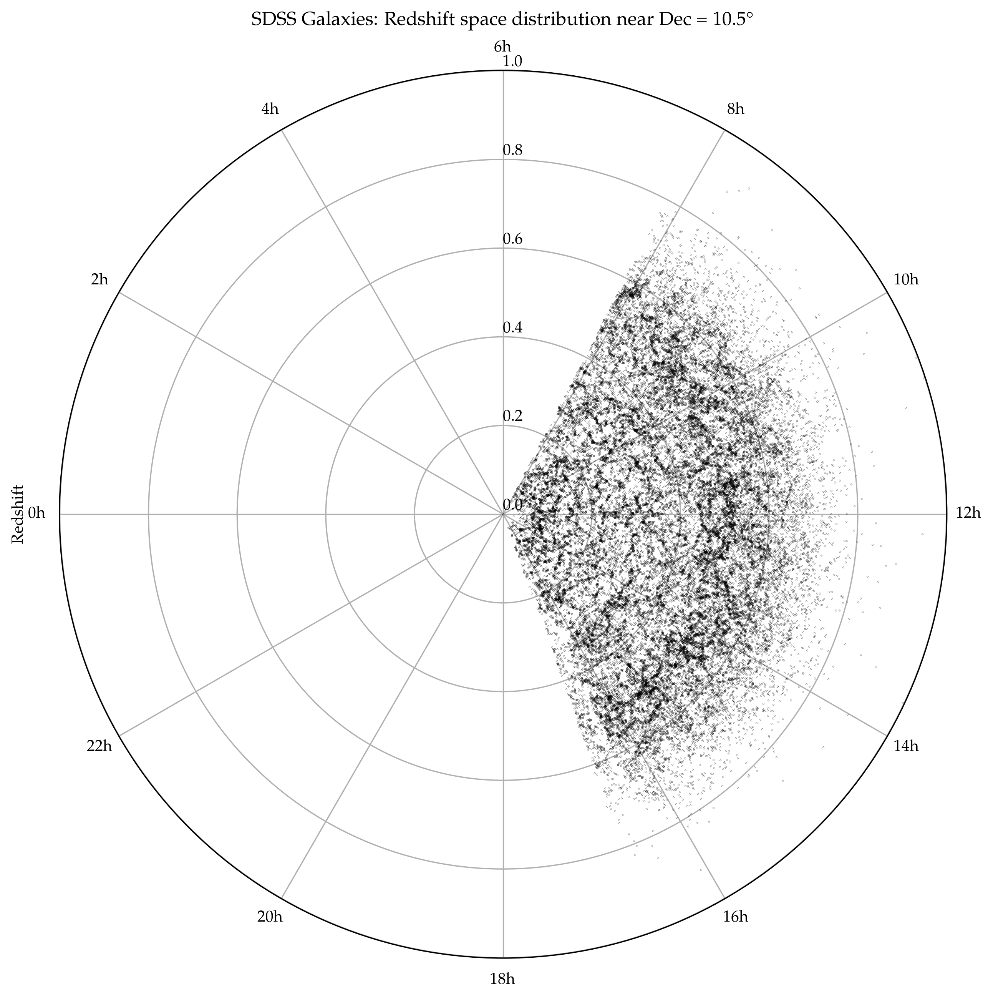

In [9]:
plt.figure(figsize=(10, 10), dpi=300)
ax = plt.subplot(111, projection='polar')

ax.scatter(theta, redshift, c='black', s=0.01, alpha=0.9)

ax.set_theta_direction(-1)  # Theta increases clockwise
ax.set_theta_zero_location('W')  # Zero at the top (RA = 0h)


ax.set_title('SDSS Galaxies: Redshift space distribution near Dec = ' + f'{((dec_max - dec_min)/2) + dec_min:.1f}°', va='bottom')

ax.set_ylim(0, redshift.max())

ra_ticks_deg = np.arange(0, 360, 30)  # Every 30 degrees
ra_ticks_rad = np.deg2rad(ra_ticks_deg)
ra_labels = [(f'{int(ra/15)}h') for ra in ra_ticks_deg]  # Convert degrees to hours

ax.set_xticks(ra_ticks_rad)
ax.set_xticklabels(ra_labels)
ax.set_rgrids(np.arange(0, redshift.max(), 0.2), angle=90.0)

ax.set_ylabel('Redshift', labelpad=20)

plt.show()

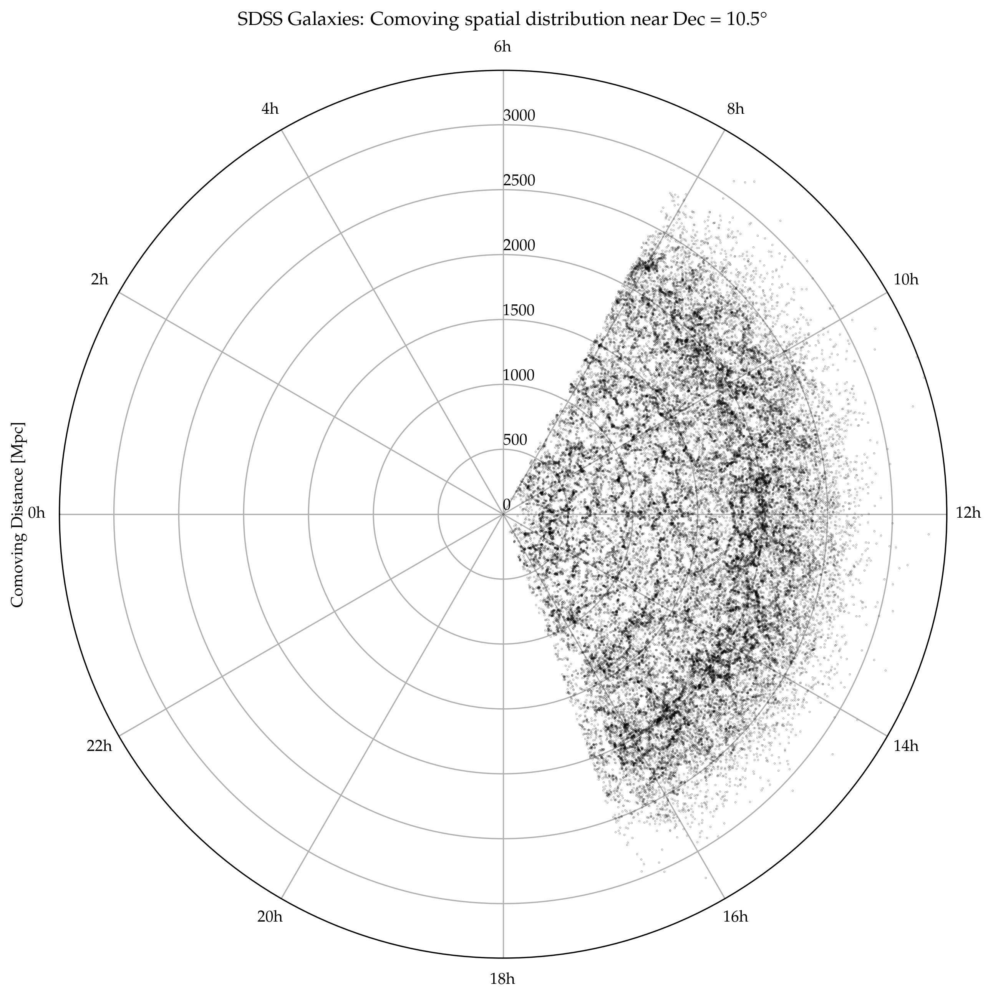

In [10]:
plt.figure(figsize=(10, 10), dpi=300)
ax = plt.subplot(111, projection='polar')

ax.scatter(theta, d_comoving, c='black', s=0.01, alpha=0.9)

ax.set_theta_direction(-1)  # Theta increases clockwise
ax.set_theta_zero_location('W')  # Zero at the top (RA = 0h)


ax.set_title('SDSS Galaxies: Comoving spatial distribution near Dec = ' + f'{((dec_max - dec_min)/2) + dec_min:.1f}°', va='bottom')

ax.set_ylim(0, d_comoving.max())

ra_ticks_deg = np.arange(0, 360, 30)  # Every 30 degrees
ra_ticks_rad = np.deg2rad(ra_ticks_deg)
ra_labels = [(f'{int(ra/15)}h') for ra in ra_ticks_deg]  # Convert degrees to hours

ax.set_xticks(ra_ticks_rad)
ax.set_xticklabels(ra_labels)
ax.set_rgrids(np.arange(0, d_comoving.max(),500), angle=90.0)

ax.set_ylabel(r'Comoving Distance [Mpc]', labelpad=20)

plt.show()

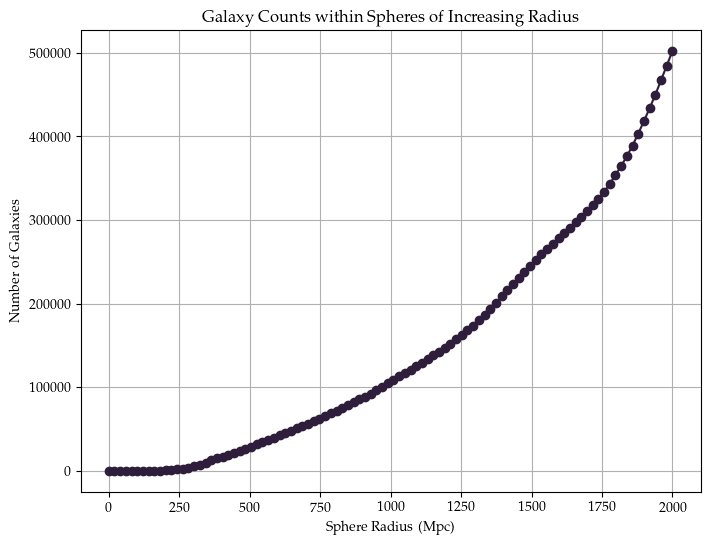

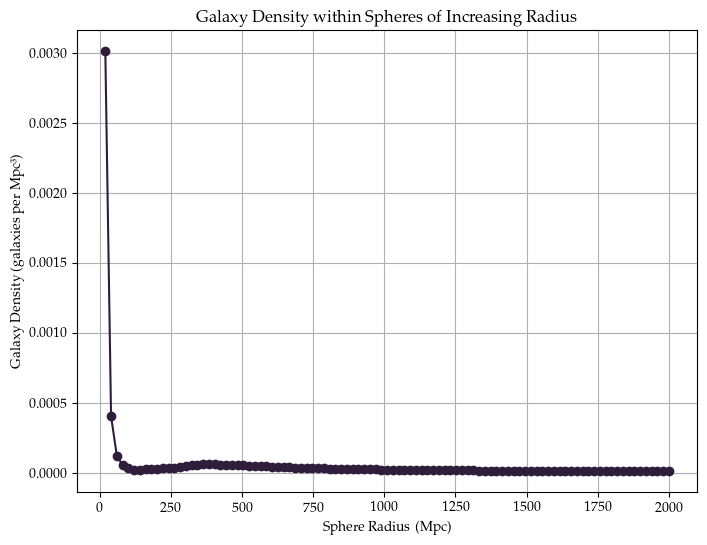

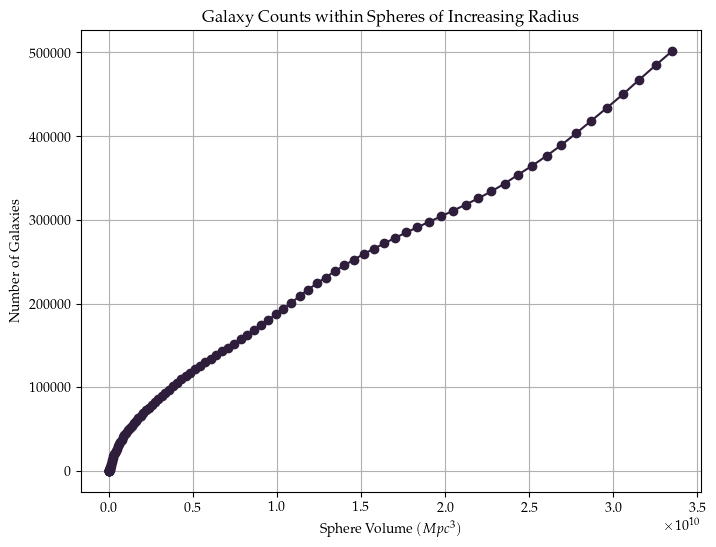

In [11]:

# Convert RA and Dec from degrees to radians
ra_rad = np.deg2rad(df['RA'].values)
dec_rad = np.deg2rad(df['Dec'].values)
r = df['d_comoving'].values  # Comoving distance in Megaparsecs (Mpc)

# Calculate Cartesian coordinates
x = r * np.cos(dec_rad) * np.cos(ra_rad)
y = r * np.cos(dec_rad) * np.sin(ra_rad)
z = r * np.sin(dec_rad)


# Define the function to count galaxies within a sphere
def count_galaxies_in_sphere(x, y, z, radius, center=(0, 0, 0)):
    """
    Counts the number of galaxies within a sphere of a given radius.

    Parameters:
    - x, y, z: Arrays of Cartesian coordinates of galaxies.
    - radius: Radius of the sphere (same units as x, y, z).
    - center: Tuple (x0, y0, z0) specifying the center of the sphere.

    Returns:
    - count: Number of galaxies within the sphere.
    """
    # Calculate the squared distance from each galaxy to the sphere's center
    dx = x - center[0]
    dy = y - center[1]
    dz = z - center[2]
    distance_squared = dx**2 + dy**2 + dz**2

    # Compare squared distances to squared radius for efficiency
    radius_squared = radius**2

    # Count galaxies within the sphere
    count = np.sum(distance_squared <= radius_squared)

    return count

# Define a range of radii (e.g., from 0 to 2000 Mpc)
radii = np.linspace(0, 2000, 100)  # Adjust the range and number of points as needed

# Initialize a list to store galaxy counts
galaxy_counts = []

# Loop over each radius and count galaxies within the sphere
for radius in radii:
    count = count_galaxies_in_sphere(x, y, z, radius)
    galaxy_counts.append(count)

# Plot the Number of Galaxies vs. Sphere Radius
plt.figure(figsize=(8, 6))
plt.plot(radii, galaxy_counts, marker='o', linestyle='-')
plt.xlabel('Sphere Radius (Mpc)')
plt.ylabel('Number of Galaxies')
plt.title('Galaxy Counts within Spheres of Increasing Radius')
plt.grid(True)
plt.show()

# Optional: Plot Galaxy Density (Galaxies per Mpc³) vs. Sphere Radius
# Calculate the volume of each sphere
volumes = (4/3) * np.pi * radii**3

# Avoid division by zero for the first element (radius = 0)
volumes[0] = np.finfo(float).eps

# Calculate galaxy density (galaxies per Mpc³)
galaxy_density = np.array(galaxy_counts) / volumes

# Plot galaxy density vs. radius
plt.figure(figsize=(8, 6))
plt.plot(radii[1:], galaxy_density[1:], marker='o', linestyle='-')
plt.xlabel('Sphere Radius (Mpc)')
plt.ylabel('Galaxy Density (galaxies per Mpc³)')
plt.title('Galaxy Density within Spheres of Increasing Radius')
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.plot(volumes, galaxy_counts, marker='o', linestyle='-')
plt.xlabel(r'Sphere Volume $(Mpc^3)$')
plt.ylabel('Number of Galaxies')
plt.title('Galaxy Counts within Spheres of Increasing Radius')
plt.grid(True)
plt.show()


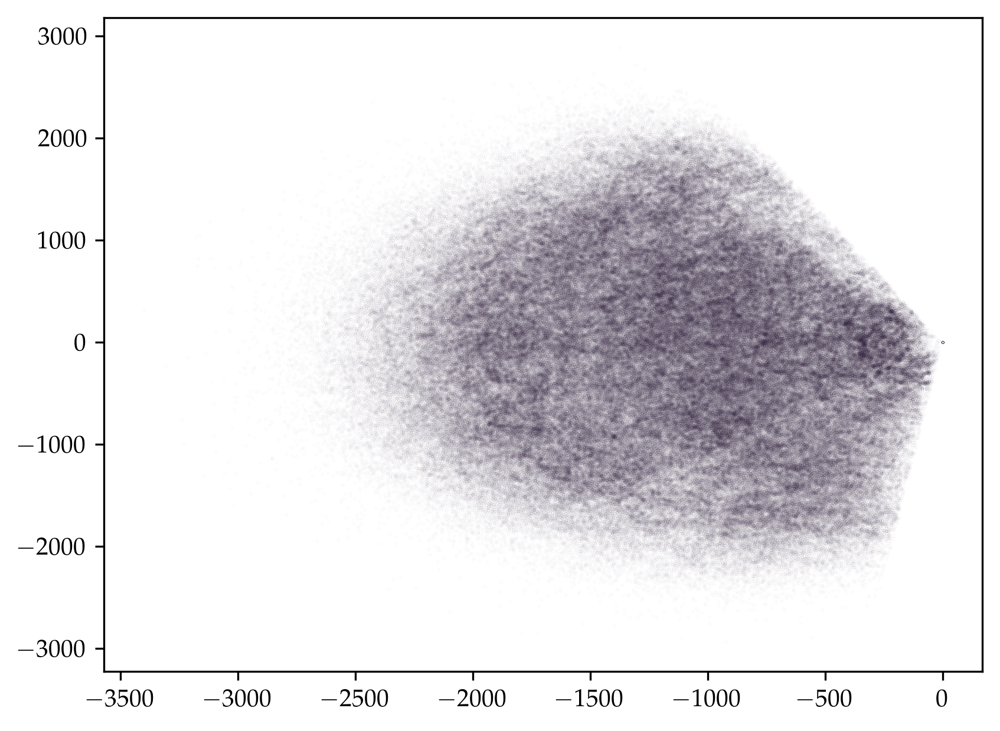

In [99]:
plt.figure(dpi = 300)
plt.scatter(x,y, s = 0.00005)
plt.show()

Total galaxies counted: 2876
Total survey volume: 209439510.24 Mpc³
Posterior mean of theta: 0.000014 galaxies per Mpc³
95% credible interval for theta: (0.000013, 0.000014) galaxies per Mpc³


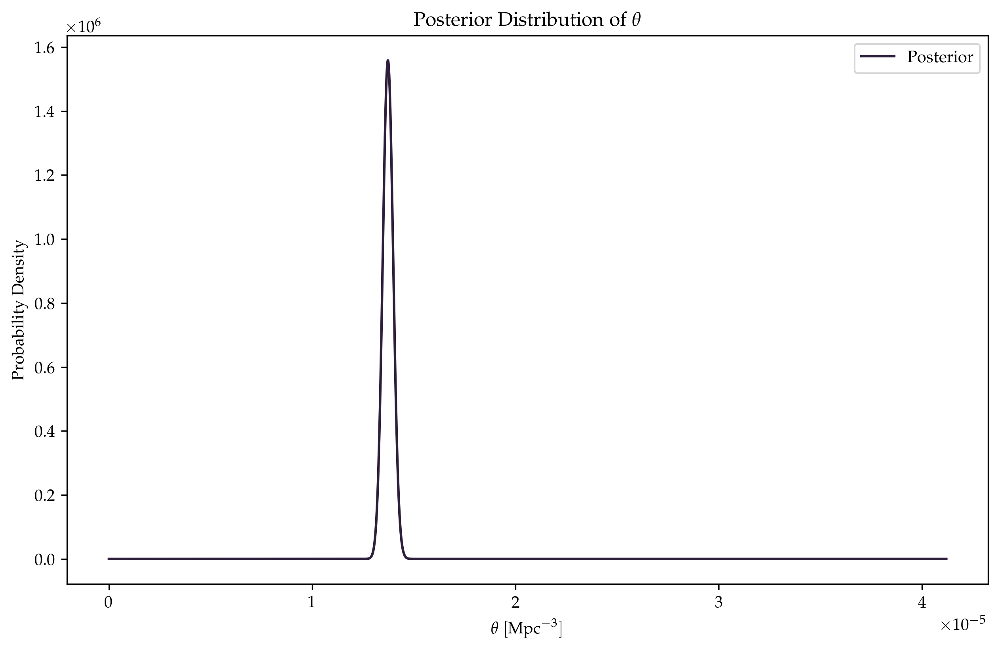

In [13]:
from scipy.stats import gamma

# Sphere parameters
num_spheres = 50  # Adjust as needed
radius = 100  # Sphere radius in Mpc
volume = (4/3) * np.pi * radius**3  # Sphere volume

# Define the survey volume bounds
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()
z_min, z_max = z.min(), z.max()

# Generate random sphere centers
np.random.seed(0)
sphere_centers = np.column_stack((
    np.random.uniform(x_min + radius, x_max - radius, num_spheres),
    np.random.uniform(y_min + radius, y_max - radius, num_spheres),
    np.random.uniform(z_min + radius, z_max - radius, num_spheres)
))

# Count galaxies within spheres
def count_galaxies_in_spheres(x, y, z, centers, radius):
    counts = []
    radius_squared = radius ** 2
    for center in centers:
        dx = x - center[0]
        dy = y - center[1]
        dz = z - center[2]
        distances_squared = dx**2 + dy**2 + dz**2
        count = np.sum(distances_squared <= radius_squared)
        counts.append(count)
    return np.array(counts)

counts = count_galaxies_in_spheres(x, y, z, sphere_centers, radius)

# Bayesian inference
alpha_prior = 1e-6  # Non-informative prior
beta_prior = 1e-6

total_counts = counts.sum()
total_volume = volume * num_spheres

alpha_posterior = alpha_prior + total_counts
beta_posterior = beta_prior + total_volume

theta_mean = alpha_posterior / beta_posterior
theta_variance = alpha_posterior / beta_posterior**2

credible_interval = gamma.interval(0.95, a=alpha_posterior, scale=1/beta_posterior)

print(f"Total galaxies counted: {total_counts}")
print(f"Total survey volume: {total_volume:.2f} Mpc³")
print(f"Posterior mean of theta: {theta_mean:.6f} galaxies per Mpc³")
print(f"95% credible interval for theta: ({credible_interval[0]:.6f}, {credible_interval[1]:.6f}) galaxies per Mpc³")

# Plot posterior distribution
theta_values = np.linspace(0, theta_mean * 3, 5000)
posterior_pdf = gamma.pdf(theta_values, a=alpha_posterior, scale=1/beta_posterior)

plt.figure(figsize=(10, 6), dpi = 300)
plt.plot(theta_values, posterior_pdf, label='Posterior')
plt.xlabel(r'$\theta$ $[\mathrm{Mpc}^{-3}]$')
plt.ylabel('Probability Density')
plt.title(r'Posterior Distribution of $\theta$')
plt.legend()
plt.show()


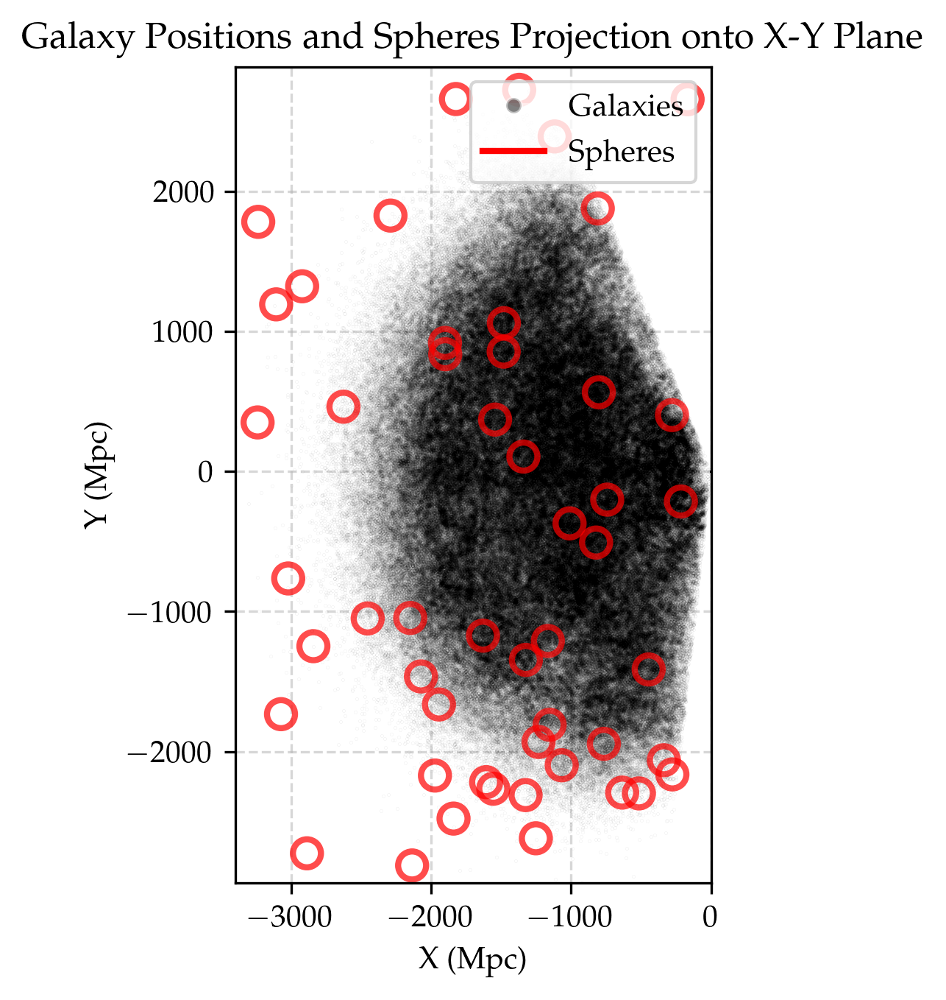

In [14]:
from matplotlib.patches import Circle
from matplotlib.lines import Line2D

# Create the scatter plot
plt.figure( dpi = 300)
plt.scatter(x, y, s=0.0001, c='black', alpha=0.9, label='Galaxies')

# Get the current axes
ax = plt.gca()

# Plot the spheres
for center in sphere_centers:
    circle = Circle((center[0], center[1]), radius, color='red', fill=False, linewidth=2, alpha=0.7)
    ax.add_patch(circle)

# Create custom legend elements
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Galaxies', markerfacecolor='black', markersize=5, alpha=0.5),
    Line2D([0], [0], color='red', lw=2, label='Spheres')
]

# Set plot limits
plt.xlim(x.min(), x.max())
plt.ylim(y.min(), y.max())

# Add labels and title
plt.xlabel('X (Mpc)')
plt.ylabel('Y (Mpc)')
plt.title('Galaxy Positions and Spheres Projection onto X-Y Plane')

# Add the legend
plt.legend(handles=legend_elements, loc='upper right')

# Adjust aspect ratio to be equal
plt.gca().set_aspect('equal', adjustable='box')

# Show grid
plt.grid(True, linestyle='--', alpha=0.5)

# Display the plot
plt.show()

In [17]:
# Sphere parameters
num_spheres = 500  # Adjust as needed
radius = 25 #25  # Sphere radius in Mpc
volume = (4/3) * np.pi * radius**3  # Sphere volume

# Randomly select sphere centers from galaxy positions
np.random.seed(0)
indices = np.random.choice(len(x), size=num_spheres, replace=False)
sphere_centers = np.column_stack((x[indices], y[indices], z[indices]))

# Add small random offsets to the sphere centers
max_offset = radius * 1.0 #radius * 0.5  # Ensure spheres stay within survey area
offsets = np.random.uniform(-max_offset, max_offset, size=(num_spheres, 3))
sphere_centers += offsets

# Ensure spheres are within survey bounds
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()
z_min, z_max = z.min(), z.max()

sphere_centers[:, 0] = np.clip(sphere_centers[:, 0], x_min + radius, x_max - radius)
sphere_centers[:, 1] = np.clip(sphere_centers[:, 1], y_min + radius, y_max - radius)
sphere_centers[:, 2] = np.clip(sphere_centers[:, 2], z_min + radius, z_max - radius)

# Count galaxies within spheres
def count_galaxies_in_spheres(x, y, z, centers, radius):
    counts = []
    radius_squared = radius ** 2
    for center in centers:
        dx = x - center[0]
        dy = y - center[1]
        dz = z - center[2]
        distances_squared = dx**2 + dy**2 + dz**2
        count = np.sum(distances_squared <= radius_squared)
        counts.append(count)
    return np.array(counts)

counts = count_galaxies_in_spheres(x, y, z, sphere_centers, radius)

# Bayesian inference
alpha_prior = 1e-0  # Non-informative prior
beta_prior = 1e-0

total_counts = counts.sum()
total_volume = volume * num_spheres

alpha_posterior = alpha_prior + total_counts
beta_posterior = beta_prior + total_volume

theta_mean = alpha_posterior / beta_posterior
theta_variance = alpha_posterior / beta_posterior**2

credible_interval = gamma.interval(0.95, a=alpha_posterior, scale=1/beta_posterior)

print(f"Total galaxies counted: {total_counts}")
print(f"Total survey volume: {total_volume:.2f} Mpc³")
print(f"Posterior mean of theta: {theta_mean:.6f} galaxies per Mpc³")
print(f"95% credible interval for theta: ({credible_interval[0]:.6f}, {credible_interval[1]:.6f}) galaxies per Mpc³")
print(f"Radius of each ball: {(radius):.6f}" )
print(f"Volume of each ball: {(volume):.6f}" )
print(f"Expected number of galaxies per ball: {(theta_mean*volume):.6f}" )

# Plot the galaxies and spheres
plt.figure(figsize=(10, 8), dpi = 300)
plt.scatter(x, y, s=0.1, c='black', alpha=0.9, label='Galaxies')

# Get the current axes
ax = plt.gca()

# Plot the spheres
for center in sphere_centers:
    circle = Circle((center[0], center[1]), radius, color='red', fill=False, linewidth=2, alpha=0.7)
    ax.add_patch(circle)

# Create custom legend elements
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Galaxies', markerfacecolor='black', markersize=5, alpha=0.5),
    Line2D([0], [0], color='red', lw=2, label='Spheres')
]

# Set plot limits
plt.xlim(x.min(), x.max())
plt.ylim(y.min(), y.max())
# plt.xlim(-1501, -1500)
# plt.ylim(1000, 1001)
# Add labels and title
plt.xlabel('X (Mpc)')
plt.ylabel('Y (Mpc)')
plt.title('Sampled Spheres Projection onto X-Y Plane')

# Add the legend
plt.legend(handles=legend_elements, loc='upper right')

# Adjust aspect ratio to be equal
plt.gca().set_aspect('equal', adjustable='box')

# Show grid
plt.grid(True, linestyle='--', alpha=0.5)

# Display the plot
plt.show()


ValueError: Cannot take a larger sample than population when 'replace=False'

Sample Mean number of galaxies per sphere:  1.7238
Sample Variance number of galaxies per sphere:  3.9249135599999994
10000
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]


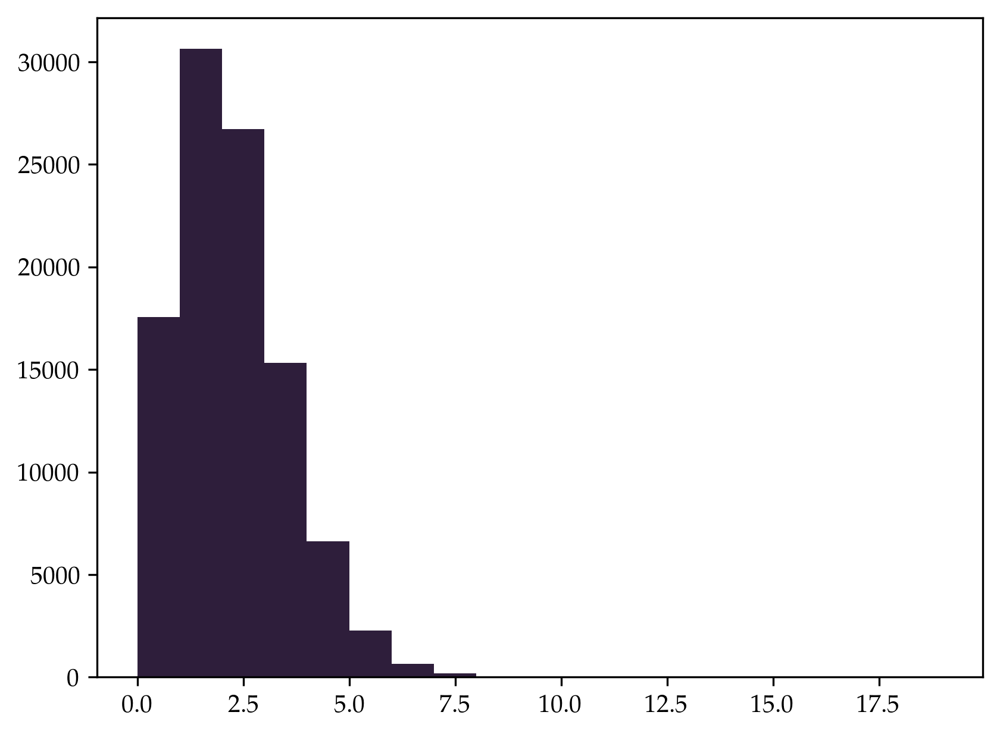

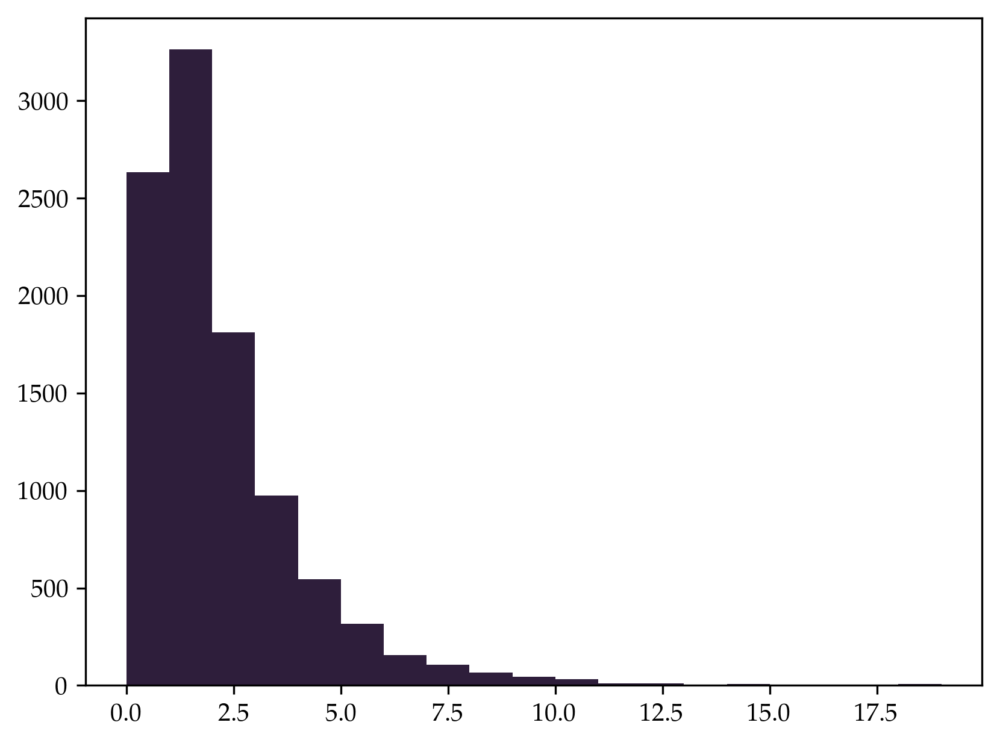

In [142]:
print('Sample Mean number of galaxies per sphere: ',counts.mean())
print('Sample Variance number of galaxies per sphere: ',counts.var())

print(counts.size)
print(np.arange(0, 20, 1))

test = np.random.poisson((theta_mean*volume), 100000)
plt.figure(dpi = 300)
plt.hist(test, bins=np.arange(0, 20, 1))
plt.show()

plt.figure(dpi = 300)
plt.hist(counts, bins=np.arange(0, 20, 1))
plt.show()

In [ ]:
def pne_mean(a_fix, prior_b, prior_c):
    return a_fix*(n_samples*sample_mean + prior_c)/(n_samples*a_fix + prior_b)

def pne_distro(X, a_fix, prior_b, prior_c):
    return stats.nbinom.pmf(X, a_fix, posterior_mean(a_fix, prior_b , prior_c ))

def x_plot_cfi(a_fix, prior_b, prior_c):
    return np.arange(stats.nbinom.ppf(0.2, a_fix, posterior_mean(a_fix, prior_b , prior_c )), stats.nbinom.ppf(0.8, a_fix,  posterior_mean(a_fix, prior_b , prior_c )))

def pne_mean_best(a_fix, theta_best, clower, cupper):
    mean = a_fix*(1-theta_best)/theta_best
    lo = a_fix*(1 - clower)/clower
    up = a_fix*(1 - cupper)/cupper 
    return mean, lo, up
 
x_plot = np.arange(0,200)
fig, ax = plt.subplots(1, 1, dpi = 300)
for ndx, a_ndx in enumerate(a_list): 
    #plt.plot( x_plot(a_ndx, b, c) , 10*pne_distro( x_plot(a_ndx, b, c) , a_ndx, b, c), color = color_list[ndx])
    #ax.plot(x_plot, 10*pne_distro( x_plot , a_ndx, b, c), color = color_list[ndx] )
    ax.scatter( x_plot, 10*pne_distro( x_plot , a_ndx, b, c), color = color_list[ndx], s = 1.0)
    #ax.vlines( x_plot,  0, 10*pne_distro( x_plot , a_ndx, b, c), color = 'black', alpha = 0.1)
    #ax.vlines( x_plot_cfi(a_ndx, b, c),  0, 10*pne_distro( x_plot_cfi(a_ndx, b, c) , a_ndx, b, c), color = color_list[ndx], alpha = 0.5)
    ax.vlines( x_plot,  0, 10*pne_distro( x_plot , a_ndx, b, c), color = color_list[ndx], alpha = 0.2)
    # ax.axvline(pne_mean(a_ndx, b, c), linestyle='-', color = color_list[ndx],
    #            label = (r'$ \langle X| a =$ ' +  f'{a_ndx:.1E}' + r'$, \langle  \theta|\{ x_i \} \rangle \rangle = $ ' + f'{pne_mean(a_ndx, b, c):.2f}'   ))

    ax.axvline(pne_mean(a_ndx, b, c), linestyle='-', color = color_list[ndx],
               label = (r'$a =$ ' +  f'{a_ndx:.1E}' + r'$, \langle  \theta|\{ x_i \} \rangle  = $ ' +  f'{posterior_mean_list[ndx]:.1E}' + r': $\langle X| a, \langle  \theta|\{ x_i \} \rangle \rangle =$ ' + f'{pne_mean(a_ndx, b, c):.2f}')  )

plt.ylabel(r'Probability $\times 10^{-1}$') 
plt.xlabel(r'Planetary Nebulae count, $X$') 
plt.title(r'Infered Planetary Nebulae distribution: $ X| a, \theta \sim \mathrm{NegBin}(a, \langle  \theta|\{ x_i \} \rangle ) $ ',
          fontsize = 12)
plt.xlim(0,150)
plt.ylim(0,0.5)
plt.legend(fancybox=True, framealpha=0.85)
plt.show()

for Adx, A in enumerate(a_list):
    cfi_lower, cfi_upper = credible_interval(0.95, A)
    print('a = ', A)
    print('95 % CI Upper Mean number of PNe:', f'{pne_mean_best(A, posterior_mean_list[Adx], cfi_lower, cfi_upper)[1]:.1f}' )
    print('Best Mean number of PNe:', f'{pne_mean_best(A, posterior_mean_list[Adx], cfi_lower, cfi_upper)[0]:.1f}' )
    print('95 % CI Lower Mean number of PNe:', f'{pne_mean_best(A, posterior_mean_list[Adx], cfi_lower, cfi_upper)[2]:.1f}' )
    print('-----------------------------------------------------------------------------------------')